##### Liberaries

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import os
import sys
import anndata
import scanpy as sc
from adjustText import adjust_text
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, roc_curve, auc
os.system('export CUDA_VISIBLE_DEVICES=4')


main_path = '/raid/users/farzaneh/Histomorphological-Phenotype-Learning'
sys.path.append(main_path)
from models.clustering.correlations import *
from models.clustering.data_processing import *
from models.visualization.attention_maps import *
from data_manipulation.data import Data
from models.clustering.logistic_regression_leiden_clusters import *


2023-08-20 11:11:04.987936: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


##### Paths

In [2]:
dataset = 'Meso_250_subsampled'
meta_field   = 'Meso_type'
meta_field = 'Meso_type'
matching_field = 'slides'
resolution     = 2.0
fold_number    = 0
groupby        = 'leiden_%s' % resolution
meta_folder    = 'meso_nn250'
folds_pickle   = '%s/files/pkl_Meso_250_subsampled_he_complete.pkl'%main_path
h5_complete_path = '%s/results/BarlowTwins_3/Meso_250_subsampled/h224_w224_n3_zdim128/hdf5_Meso_250_subsampled_he_complete_combined_metadata_filtered.h5'%main_path

file_name = h5_complete_path.split('/hdf5_')[1].split('.h5')[0] + '_%s__fold%s' % (groupby.replace('.', 'p'), fold_number)

# Setup folder esqueme
main_cluster_path = h5_complete_path.split('hdf5_')[0]
main_cluster_path = os.path.join(main_cluster_path, meta_folder)
figures_path      = os.path.join(main_cluster_path, 'figures')
adatas_path       = os.path.join(main_cluster_path, 'adatas')


print('figures_path:', figures_path)
if not os.path.isdir(figures_path):
    os.makedirs(figures_path)

figures_path: /raid/users/farzaneh/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_250_subsampled/h224_w224_n3_zdim128/meso_nn250/figures


## Adding lr from HPL implementations

#### Loading the data

In [3]:
# Initialize classification environment.
resolutions = [2.0, 8.0, 7.0, 5.0, 4.0, 9.5, 1.0]
alphas = [5.0]
dataset = 'Meso_250_subsampled'
force_fold = None
additional_as_fold = False
diversity_key = None
# Use connectivity between clusters as features.
use_conn          = False
use_ratio         = False
top_variance_feat = 99
type_composition  = 'clr' # can be also 'clr', 'ilr', 'alr'
min_tiles         = 100
p_th              = 0.05
h5_additional_path = None
if diversity_key is None:
    diversity_key = matching_field


folds = load_existing_split(folds_pickle)
data_res_folds = dict()
for resolution in resolutions:
    groupby = 'leiden_%s' % resolution
    print('\tResolution', groupby)
    data_res_folds[resolution] = dict()
    for i, fold in enumerate(folds):

        # Read CSV files for train, validation, test, and additional sets.
        dataframes, complete_df, leiden_clusters = read_csvs(adatas_path, matching_field, groupby, i, fold, h5_complete_path, h5_additional_path, additional_as_fold=additional_as_fold, force_fold=force_fold)
        train_df, valid_df, test_df, additional_df = dataframes

        # Check clusters and diversity within.
        frame_clusters, frame_samples = create_frames(complete_df, groupby, meta_field, diversity_key=matching_field, reduction=2)

        # Create representations per sample: cluster % of total sample.
        data, data_df, features = prepare_data_classes(dataframes, matching_field, meta_field, groupby, leiden_clusters, type_composition, min_tiles,
                                                    use_conn=use_conn, use_ratio=use_ratio, top_variance_feat=top_variance_feat)

        # Include features that are not the regular leiden clusters.
        frame_clusters = include_features_frame_clusters(frame_clusters, leiden_clusters, features, groupby)

        # Store representations.
        data_res_folds[resolution][i] = {'data':data, 'features':features, 'frame_clusters':frame_clusters, 'leiden_clusters':leiden_clusters}
        # Information.
        print('\t\tFold', i, 'Features:', len(features), 'Clusters:', len(leiden_clusters))
        
print()

	Resolution leiden_2.0
Adata name: Meso_250_subsampled_he_complete_combined_metadata_filtered_leiden_2p0__fold0
Train csv not found: /raid/users/farzaneh/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_250_subsampled/h224_w224_n3_zdim128/meso_nn250/adatas/Meso_250_subsampled_he_complete_combined_metadata_filtered_leiden_2p0__fold0_train.csv
Train csv: /raid/users/farzaneh/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_250_subsampled/h224_w224_n3_zdim128/meso_nn250/adatas/Meso_250_subsampled_he_complete_combined_metadata_filtered_leiden_2p0__fold0.csv
		Fold 0 Features: 45 Clusters: 45
Adata name: Meso_250_subsampled_he_complete_combined_metadata_filtered_leiden_2p0__fold1
Train csv not found: /raid/users/farzaneh/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_250_subsampled/h224_w224_n3_zdim128/meso_nn250/adatas/Meso_250_subsampled_he_complete_combined_metadata_filtered_leiden_2p0__fold1_train.csv
Train csv: /raid/users/farzaneh/Hist

### Make CSV from hdf5 files (clusters-labels)

In [105]:
for resolution in resolutions:
    for i, fold in enumerate(folds):
        csv_complete_path = '/raid/users/farzaneh/Histomorphological-Phenotype-Learning/datasets/clf_csvs/data_label_res-{}_fold-{}.csv'.format(resolution, i)
        data = data_res_folds[resolution][i]['data']
        train, valid, test, additional = data
        X_train, y_train = train
        X_valid, y_valid = valid
        X_test, y_test = test
        X = np.vstack((X_train, X_valid, X_test))
        y = np.concatenate((y_train[:,1], y_valid[:,1], y_test[:,1]))
        df = pd.DataFrame(X)
        df['label'] = y
        df.to_csv(csv_complete_path, index=False)

In [5]:
def get_model_report(model, data, label):
	train, valid, test, additional = data
	train_data, train_labels = train	
	test_data,  test_labels  = test
	train_pred = model.predict(train_data)
	
	if valid is not None:
		valid_data, valid_labels = valid
		valid_pred = model.predict(valid_data)
	test_pred  = model.predict(test_data)
	if additional is not None:
		additional_data, additional_labels = additional
		additional_pred = model.predict(additional_data)

	print('train report:\n', classification_report(list(train_labels[:,label]), list(train_pred), labels=[0,1]))
	train_auc = roc_auc_score(y_true=list(train_labels[:,label]), y_score=list(train_pred))

	aucs = [train_auc]
	valid_auc = None
	if valid is not None:
		print('valid report:\n', classification_report(list(valid_labels[:,label]), list(valid_pred), labels=[0,1]))
		valid_auc = roc_auc_score(y_true=list(valid_labels[:,label]), y_score=list(valid_pred))
		aucs.append(valid_auc)

	test_auc  = roc_auc_score(y_true=list(test_labels[:,label]),  y_score=list(test_pred))
	print('test report:\n', classification_report(list(test_labels[:,label]), list(test_pred), labels=[0,1]))
	aucs.append(test_auc)
	
	additional_auc = None
	if additional is not None:
		additional_auc  = roc_auc_score(y_true=list(additional_labels[:,label]),   y_score=list(additional_pred))
		aucs.append(additional_auc)
	return aucs

In [6]:
def model_confusion_matrix(model, data, label):
	train, valid, test, additional = data
	test_data,  test_labels  = test
	if additional is not None:
		additional_data, additional_labels = additional

	test_pred  = model.predict(test_data)
	if additional is not None:
		additional_pred = model.predict(additional_data)

	test_labels = test_labels[:,label]
	test_pred   = (test_pred > 0.5)*1.0

	cm_test = confusion_matrix(test_labels, test_pred)
	cm_additional = None
	if additional is not None:
		additional_labels = additional_labels[:,label]
		additional_pred   = (additional_pred > 0.5)*1.0
		cm_additional = confusion_matrix(additional_labels, additional_pred)
	return [cm_test, cm_additional]

In [7]:
def classification_performance(data, leiden_clusters, frame_clusters, features, groupby, alpha):
	train, valid, test, additional = data
	train_data, train_labels = train

	labels = np.unique(np.argmax(train_labels, axis=1)).tolist()
	if len(labels) == 2:
		labels.remove(0)

	# One-vs-rest.
	num_sets = len([1 for set in data if set is not None])
	shape_aucs = (len(labels), num_sets)
	total_aucs = np.zeros(shape_aucs)
	cms        = dict()
	for label in labels:

		model = SVC(kernel='rbf', C=1/alpha, class_weight='balanced').fit(train_data, train_labels[:,label])
		total_aucs[label-1,:]  = get_model_report(model, data, label)

		# Include information in Clusters DataFrame.
		# frame_clusters = include_coefficients(model, frame_clusters, features, label, groupby)
		frame_clusters = []

		label_cms = model_confusion_matrix(model, data, label)
		cms[label] = label_cms

	aucs = total_aucs.mean(axis=0).tolist()
	return frame_clusters, aucs, cms

In [9]:
def run_classifier_model(data_res_folds, alphas, resolutions):
	for alpha in alphas:
		# alpha_path = os.path.join(main_cluster_path, 'classification' ,'alpha_%s' % (str(alpha).replace('.', 'p')))
		# print('Alpha saving results path:', alpha_path)
		# if not os.path.isdir(alpha_path):
		# 	os.makedirs(alpha_path)

		print('\tAlpha', alpha)
		all_data = list()
		for resolution in resolutions:
			groupby = 'leiden_%s' % resolution
			print('\t\tResolution', groupby)
			for i, fold in enumerate(folds):
				# Load data for classification.
				data            = data_res_folds[resolution][i]['data']
				features        = data_res_folds[resolution][i]['features']
				frame_clusters  = data_res_folds[resolution][i]['frame_clusters']
				leiden_clusters = data_res_folds[resolution][i]['leiden_clusters']


				frame_clusters, aucs, cms = classification_performance(data, leiden_clusters, frame_clusters, features, groupby, alpha=alpha)
				print('\t\t\tFold %s %-3s features Train/Validation/Test/Additional AUCs:' % (i, len(features)), np.round(aucs,2))
				all_data.append([groupby, i, alpha] + aucs)
			print('_________________________________________________________________________________________')
	print(all_data)

	df_all_data = pd.DataFrame(np.array(all_data), columns=['resolution', 'fold', 'resolution(int)', 'alpha', 'train_auc', 'valid_auc', 'test_auc'])
	df_all_data['train_auc'] = df_all_data['train_auc'].astype(float)
	df_all_data['valid_auc'] = df_all_data['valid_auc'].astype(float)
	df_all_data['test_auc'] = df_all_data['test_auc'].astype(float)
	df_all_data['resolution(int)'] = df_all_data['resolution(int)'].astype(float)
	df_all_data['alpha'] = df_all_data['alpha'].astype(float)
	df_all_data['fold'] = df_all_data['fold'].astype(int)
	display(df_all_data)





				# file_name_csv = '%s_fold%s_clusters.csv' % (str(groupby).replace('.', 'p'), i)
				# frame_clusters.to_csv(os.path.join(alpha_path, file_name_csv), index=False)

				# Report forest plots and confusion matrices for logistic regression.
				# report_forest_plot_lr(meta_field, frame_clusters, directory=alpha_path, file_name=file_name_csv)
			# plot_confusion_matrix_lr(cms, directory=alpha_path, file_name='%s_fold%s_cm.jpg' % (str(groupby).replace('.', 'p'), i))

			# if force_fold is not None:
				# summarize_stat_clusters_across_folds(data, meta_field, frame_clusters, alpha, groupby, folds, alpha_path, p_th)

		# Save to CSV.
		# columns = ['Leiden Resolution', 'Fold', 'Train Precision', 'Test Precision']
		# if valid_df is not None: columns.append('Valid Precision')
		# if additional_df is not None: columns.append('Additional Precision')
		# results_df = pd.DataFrame(all_data, columns=columns)
		# results_df.to_csv(os.path.join(alpha_path, '%s_f1_results_mintiles_%s.csv' % (meta_field, min_tiles)), index=False)

		# Performance figures.
		# box_plot_auc_results(frame=results_df, columns=columns, path_file=os.path.join(alpha_path, '%s_f1_results_mintiles_%s.csv' % (meta_field, min_tiles)))

In [95]:
import wandb
wandb.finish()
import sys

wandb.init(project="sklearn", entity="farzaneh_uog", settings=wandb.Settings(start_method="fork"))

#dataset
i = 0 #fold
resolution = 7.0 #resolution
kernel = 'rbf' #kernel(or 'poly')


data = data_res_folds[resolution][i]['data']
train, valid, test, additional = data
X_train, y_train = train
X_valid, y_valid = valid
X_test, y_test = test
labels = [0,1]



clf = SVC()
y_pred = clf.fit(X_train, y_train[:,1]).predict(X_test)
wandb.sklearn.plot_confusion_matrix(y_pred, y_test[:,1], labels)
wandb.sklearn.plot_class_proportions(y_train[:,1], y_test[:,1], labels)
wandb.sklearn.plot_roc(y_test[:,1], y_pred, labels)
wandb.sklearn.plot_precision_recall(y_test[:,1], y_pred, labels)
# wandb.sklearn.plot_classifier(clf, X_train, X_test, y_train[:,1], y_test[:,1], y_pred, y_probas, labels, model_name='SVC', feature_names=None)
wandb.finish()


Problem at: /tmp/ipykernel_1680528/2122566221.py 5 <module>


Traceback (most recent call last):
  File "/home/farzaneh/miniconda3/envs/HPL/lib/python3.8/site-packages/wandb/sdk/wandb_init.py", line 1147, in init
    run = wi.init()
  File "/home/farzaneh/miniconda3/envs/HPL/lib/python3.8/site-packages/wandb/sdk/wandb_init.py", line 601, in init
    manager._inform_init(settings=self.settings, run_id=self.settings.run_id)
  File "/home/farzaneh/miniconda3/envs/HPL/lib/python3.8/site-packages/wandb/sdk/wandb_manager.py", line 207, in _inform_init
    svc_iface._svc_inform_init(settings=settings, run_id=run_id)
  File "/home/farzaneh/miniconda3/envs/HPL/lib/python3.8/site-packages/wandb/sdk/service/service_sock.py", line 37, in _svc_inform_init
    self._sock_client.send(inform_init=inform_init)
  File "/home/farzaneh/miniconda3/envs/HPL/lib/python3.8/site-packages/wandb/sdk/lib/sock_client.py", line 211, in send
    self.send_server_request(server_req)
  File "/home/farzaneh/miniconda3/envs/HPL/lib/python3.8/site-packages/wandb/sdk/lib/sock_client

Error: An unexpected error occurred

In [ ]:
from sklearn.model_selection import validation_curve

i = 0 #fold
resolution = 7.0 #resolution
kernel = 'rbf' #kernel(or 'poly')


data = data_res_folds[resolution][i]['data']
train, valid, test, additional = data
X, y = train
X_valid, y_valid = valid
X_test, y_test = test
# Add valid and test to train
X = np.vstack([X, X_valid, X_test])
y = np.vstack([y, y_valid, y_test])



C_values = np.logspace(-7, 4, 20)
param_name = "C"

# gamma_values = np.logspace(-7, 4, 20)



kernels = ['poly', 'sigmoid', 'rbf', 'linear']
for k in kernels:
    train_scores, valid_scores = validation_curve( SVC(kernel=k), X, y[:,1], param_name=param_name, param_range=C_values, cv=2)
    train_scores = np.mean(np.array(train_scores).reshape(-1, 2), axis=1)
    valid_scores = np.mean(np.array(valid_scores).reshape(-1, 2), axis=1)

    plt.plot(train_scores, label='train', color='gray')
    plt.plot(valid_scores, label='valid', color='violet')
    plt.legend()
    add_title = 'Kernel:{}'.format(k) +' - res:' + str(resolution) + ' - fold_' + str(i) + " - Max train score:{:.2f}".format(train_scores.max()) + " - Max valid score:{:.2f}".format(valid_scores.max()) + ' - Max valid {} value:{:.2f} '.format(param_name, C_values[np.argmax(valid_scores)])
    plt.title(add_title)

    plt.show()
    plt.close()

In [24]:
run_classifier_model(data_res_folds, alphas, resolutions)


	Alpha 5.0
		Resolution leiden_2.0
train report:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       952
           1       0.69      0.82      0.75       313

    accuracy                           0.86      1265
   macro avg       0.81      0.85      0.83      1265
weighted avg       0.87      0.86      0.87      1265

valid report:
               precision    recall  f1-score   support

           0       0.87      0.86      0.86       143
           1       0.63      0.64      0.64        53

    accuracy                           0.80       196
   macro avg       0.75      0.75      0.75       196
weighted avg       0.80      0.80      0.80       196

test report:
               precision    recall  f1-score   support

           0       0.93      0.87      0.90       177
           1       0.70      0.83      0.76        64

    accuracy                           0.86       241
   macro avg       0.82      0.85      0.83      

<Axes: xlabel='resolution(int)'>

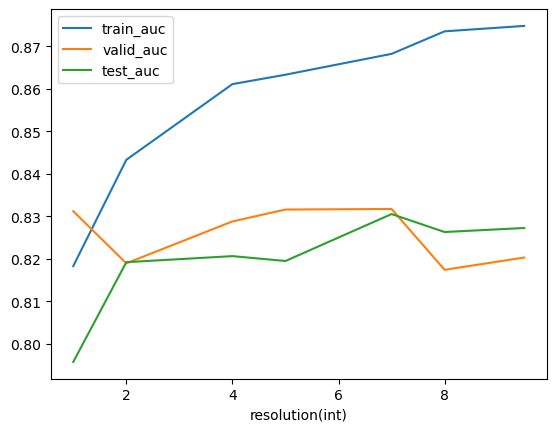

In [56]:
all_data = [['leiden_2.0', 0, 2.0, 5.0, 0.8480213171530593, 0.750824647051062, 0.8490907485875706], ['leiden_2.0', 1, 2.0, 5.0, 0.8374452417425892, 0.8163362952836638, 0.7880439447257747], ['leiden_2.0', 2, 2.0, 5.0, 0.846817624186472, 0.8457963089542037, 0.798136645962733], ['leiden_2.0', 3, 2.0, 5.0, 0.8346621089325503, 0.8345181134654819, 0.8191489361702128], ['leiden_2.0', 4, 2.0, 5.0, 0.8496636830676341, 0.8473684210526317, 0.8417616004445679], ['leiden_8.0', 0, 8.0, 5.0, 0.8770169409616883, 0.7742446233012271, 0.8306408898305085], ['leiden_8.0', 1, 8.0, 5.0, 0.8739686634953909, 0.8291866028708135, 0.8089863531027379], ['leiden_8.0', 2, 8.0, 5.0, 0.8732317246446122, 0.8200956937799043, 0.8015010351966874], ['leiden_8.0', 3, 8.0, 5.0, 0.873407920584526, 0.8291866028708135, 0.8351063829787234], ['leiden_8.0', 4, 8.0, 5.0, 0.8701273767279276, 0.8345181134654819, 0.8554228026303602], ['leiden_7.0', 0, 7.0, 5.0, 0.8686353934545064, 0.8238553898931259, 0.8278160310734463], ['leiden_7.0', 1, 7.0, 5.0, 0.8734311591281679, 0.823855092276145, 0.8198008754613338], ['leiden_7.0', 2, 7.0, 5.0, 0.8683730827078093, 0.8291866028708135, 0.8036453711919551], ['leiden_7.0', 3, 7.0, 5.0, 0.8633271459049706, 0.8345181134654819, 0.8430851063829787], ['leiden_7.0', 4, 7.0, 5.0, 0.8674858323182034, 0.8473684210526317, 0.8584328980272298], ['leiden_5.0', 0, 5.0, 5.0, 0.8654841329503047, 0.8049874653648239, 0.8306408898305085], ['leiden_5.0', 1, 5.0, 5.0, 0.8676193931575694, 0.843609022556391, 0.7903184276027809], ['leiden_5.0', 2, 5.0, 5.0, 0.859099383832713, 0.832946001367054, 0.7989500147885241], ['leiden_5.0', 3, 5.0, 5.0, 0.8596468094170632, 0.832946001367054, 0.8219747340425532], ['leiden_5.0', 4, 5.0, 5.0, 0.8648840103808061, 0.843609022556391, 0.8557006575900713], ['leiden_4.0', 0, 4.0, 5.0, 0.8643682712701695, 0.779126533843515, 0.8419403248587571], ['leiden_4.0', 1, 4.0, 5.0, 0.8596475315111936, 0.8351332877648667, 0.8161531199038708], ['leiden_4.0', 2, 4.0, 5.0, 0.8591427026802237, 0.8291866028708135, 0.7789485359361136], ['leiden_4.0', 3, 4.0, 5.0, 0.8628926734762189, 0.842036910457963, 0.8193151595744681], ['leiden_4.0', 4, 4.0, 5.0, 0.8596009215613579, 0.8586466165413534, 0.8469482263591738], ['leiden_9.5', 0, 9.5, 5.0, 0.8739093081321985, 0.7955535031006729, 0.8306408898305085], ['leiden_9.5', 1, 9.5, 5.0, 0.8808655164073208, 0.8382775119617225, 0.8060252338855035], ['leiden_9.5', 2, 9.5, 5.0, 0.8742921700316748, 0.8185235816814764, 0.8108917480035492], ['leiden_9.5', 3, 9.5, 5.0, 0.8706878188807855, 0.8147641831852357, 0.8194813829787234], ['leiden_9.5', 4, 9.5, 5.0, 0.8743644404427732, 0.8345181134654819, 0.8693618597758636], ['leiden_1.0', 0, 1.0, 5.0, 0.8230746771552071, 0.7710779786251484, 0.8441031073446328], ['leiden_1.0', 1, 1.0, 5.0, 0.8205575264049021, 0.8451811346548189, 0.7690327010557033], ['leiden_1.0', 2, 1.0, 5.0, 0.8260523014437307, 0.8511278195488722, 0.7734398107068915], ['leiden_1.0', 3, 1.0, 5.0, 0.8123062202251142, 0.8307587149692413, 0.7928856382978724], ['leiden_1.0', 4, 1.0, 5.0, 0.8096631534346698, 0.8580314422419686, 0.7993887190886357]]
all_data = np.array(all_data)
df_all_data = pd.DataFrame(all_data, columns=['resolution', 'fold', 'resolution(int)', 'alpha', 'train_auc', 'valid_auc', 'test_auc'])
# display(df_all_data)
# groupby resolution and plot train, valid and test AUC for each resolution.
df_all_data['train_auc'] = df_all_data['train_auc'].astype(float)
df_all_data['valid_auc'] = df_all_data['valid_auc'].astype(float)
df_all_data['test_auc'] = df_all_data['test_auc'].astype(float)
df_all_data['resolution(int)'] = df_all_data['resolution(int)'].astype(float)
df_all_data['alpha'] = df_all_data['alpha'].astype(float)
df_all_data['fold'] = df_all_data['fold'].astype(int)

df_all_data.groupby(['resolution(int)']).mean().drop(columns=['fold', 'alpha']).plot()


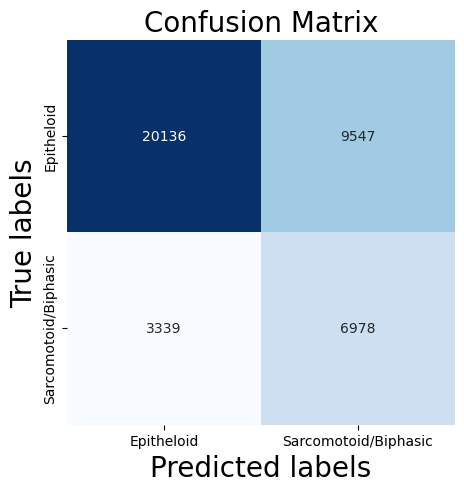

Precision: 0.4222692889561271
Recall: 0.6763594068043036
F1-Score: 0.5199314507115714
ROC-AUC: 0.7508706608403644


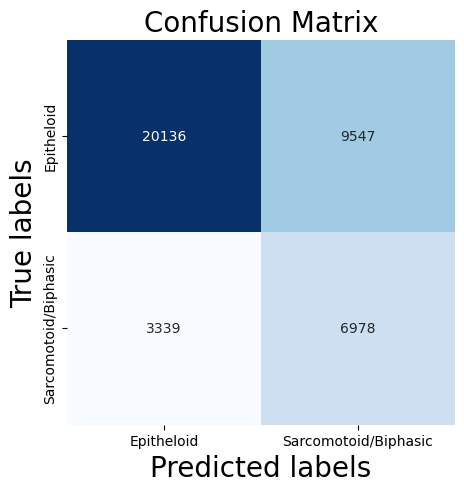

Precision: 0.4222692889561271
Recall: 0.6763594068043036
F1-Score: 0.5199314507115714
ROC-AUC: 0.7508706608403644


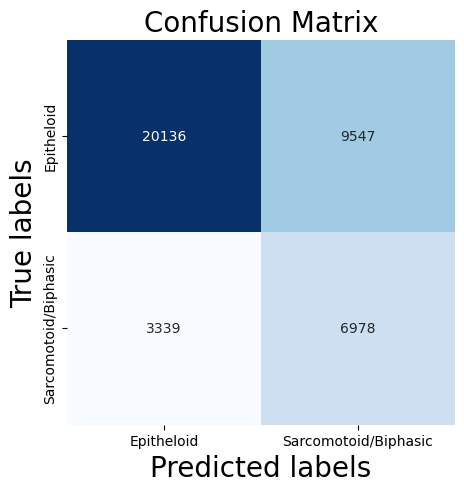

Precision: 0.4222692889561271
Recall: 0.6763594068043036
F1-Score: 0.5199314507115714
ROC-AUC: 0.7508706608403644


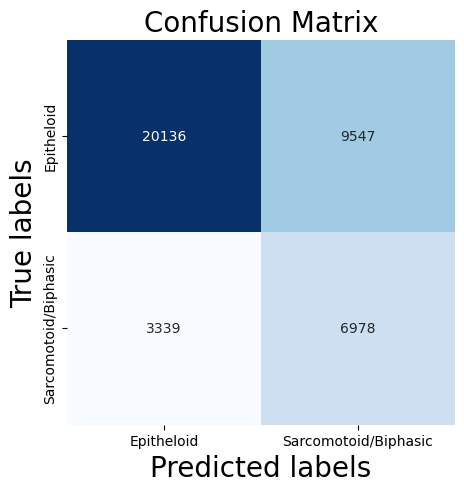

Precision: 0.4222692889561271
Recall: 0.6763594068043036
F1-Score: 0.5199314507115714
ROC-AUC: 0.7508706608403644


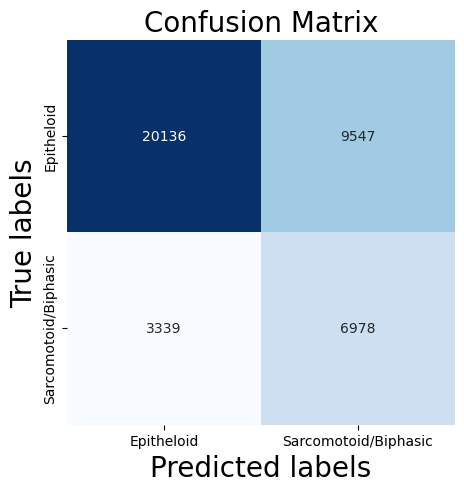

Precision: 0.4222692889561271
Recall: 0.6763594068043036
F1-Score: 0.5199314507115714
ROC-AUC: 0.7508706608403644
precision_avg:  0.42226928895612714
recall_avg:  0.6763594068043036
f1_avg:  0.5199314507115714
roc_auc_avg:  0.7508706608403644


In [67]:
precisions, recalls, f1s, roc_aucs = [], [], [], []

#do for all folds
for fold_number in range(5):
    # Load data.
    # adata_train, h5ad_path = read_h5ad_reference(h5_complete_path, meta_folder, groupby, fold_number)
    # Run logistic regression.


    precision, recall, f1, roc_auc = run_lr(adata_train)
    precisions.append(precision)
    recalls.append(recall)
    f1s.append(f1)
    roc_aucs.append(roc_auc)
    break

#get average of all folds
precision_avg = np.mean(precisions)
recall_avg = np.mean(recalls)
f1_avg = np.mean(f1s)
roc_auc_avg = np.mean(roc_auc)
print('precision_avg: ', precision_avg)
print('recall_avg: ', recall_avg)
print('f1_avg: ', f1_avg)
print('roc_auc_avg: ', roc_auc_avg)


In [3]:
adata_train, h5ad_path = read_h5ad_reference(h5_complete_path, meta_folder, groupby, fold_number)
adata_train

AnnData object with n_obs × n_vars = 200000 × 128
    obs: 'Meso_type', 'case_number', 'hist_subtype', 'indexes', 'labels', 'original_set', 'os_event_data', 'os_event_ind', 'patterns', 'samples', 'slides', 'stage', 'tiles', 'type', 'leiden_2.0'
    uns: 'leiden', 'nn_leiden', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'nn_leiden_connectivities', 'nn_leiden_distances'

In [5]:
done = False
if os.path.isfile(h5ad_path.replace('.h5ad', '_paga.h5ad')):
    done=True
    adata_train = anndata.read_h5ad(h5ad_path.replace('.h5ad', '_paga.h5ad'))
else:
    sc.tl.paga(adata_train, groups=groupby, neighbors_key='nn_leiden')

print(done)
# Run UMAP based on PAGA cluster visualization.
if not done:
    sc.tl.umap(adata_train, init_pos="paga", neighbors_key='nn_leiden')
    adata_train.write(h5ad_path.replace('.h5ad', '_paga.h5ad'))

adata_train

False


AnnData object with n_obs × n_vars = 200000 × 128
    obs: 'Meso_type', 'case_number', 'hist_subtype', 'indexes', 'labels', 'original_set', 'os_event_data', 'os_event_ind', 'patterns', 'samples', 'slides', 'stage', 'tiles', 'type', 'leiden_2.0'
    uns: 'leiden', 'leiden_2.0_colors', 'leiden_2.0_sizes', 'nn_leiden', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'nn_leiden_connectivities', 'nn_leiden_distances'

In [4]:
adata_train

AnnData object with n_obs × n_vars = 200000 × 128
    obs: 'Meso_type', 'case_number', 'hist_subtype', 'indexes', 'labels', 'original_set', 'os_event_data', 'os_event_ind', 'patterns', 'samples', 'slides', 'stage', 'tiles', 'type', 'leiden_2.0'
    uns: 'leiden', 'nn_leiden', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'nn_leiden_connectivities', 'nn_leiden_distances'

In [5]:
wsi = adata_train[adata_train.obs['samples'] == 'MESO_56_20']
wsi

View of AnnData object with n_obs × n_vars = 69 × 128
    obs: 'Meso_type', 'case_number', 'hist_subtype', 'indexes', 'labels', 'original_set', 'os_event_data', 'os_event_ind', 'patterns', 'samples', 'slides', 'stage', 'tiles', 'type', 'leiden_2.0'
    uns: 'leiden', 'nn_leiden', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'nn_leiden_connectivities', 'nn_leiden_distances'

,type,Meso_type,os_event_ind,slides,samples,os_event_data,tiles,stage,leiden_2.0
393423,Epithelioid,0,1.0,MESO_403_4,MESO_403_4,19.0,18_30.jpeg,Missing,23
76481,Epithelioid,0,1.0,MESO_56_20,MESO_56_20,28.0,49_24.jpeg,IIIA,15
258546,Epithelioid,0,1.0,MESO_81_31,MESO_81_31,1.0,40_32.jpeg,IB,2
202798,Biphasic,1,1.0,MESO_395_3,MESO_395_3,29.0,30_37.jpeg,IB,12
16418,Epithelioid,0,1.0,MESO_31_18,MESO_31_18,4.0,31_43.jpeg,IIIA,3
...,...,...,...,...,...,...,...,...,...
296361,Epithelioid,0,1.0,MESO_32_27,MESO_32_27,57.0,56_14.jpeg,IB,21
575235,Epithelioid,0,1.0,MESO_431_17,MESO_431_17,6.0,11_21.jpeg,IIIB,8
130124,Epithelioid,0,1.0,MESO_454_19,MESO_454_19,9.0,53_24.jpeg,IIIA,34
183516,Epithelioid,0,1.0,MESO_45_20,MESO_45_20,34.0,42_6.jpeg,IB,3


<Axes: xlabel='leiden_2.0'>

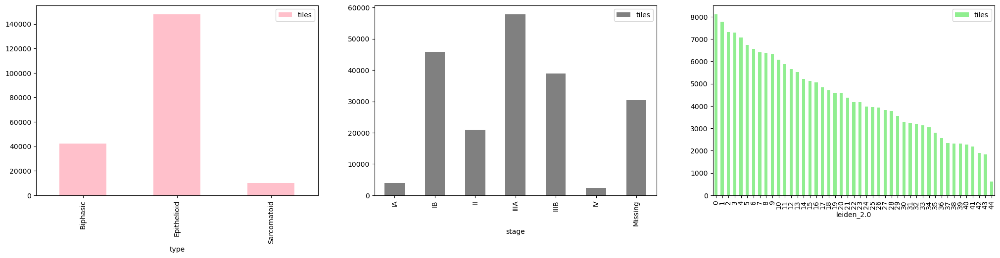

In [6]:
display(adata_train.obs[['type', 'Meso_type', 'os_event_ind', 'slides', 'samples', 'os_event_data', 'tiles', 'stage', 'leiden_2.0' ]])
fig = plt.figure(figsize=(25, 5))
adata_train.obs[['tiles', 'type']].groupby('type').count().plot.bar(ax=fig.add_subplot(1,3,1), color='pink')
adata_train.obs[['tiles', 'stage']].groupby('stage').count().plot.bar(ax=fig.add_subplot(1,3,2), color='gray')
adata_train.obs[['tiles', 'leiden_2.0']].groupby('leiden_2.0').count().plot.bar(ax=fig.add_subplot(1,3,3), color='lightgreen')

In [9]:
# Representations and Cluster Network.
def show_umap_leiden(adata, meta_field, layout, random_state, threshold, node_size_scale, node_size_power, edge_width_scale, directory, file_name,
                     fontsize=10, fontoutline=2, marker_size=2, ax_size=16, l_size=12, l_t_size=14, l_box_w=1, l_markerscale=1, palette='tab20', figsize=(30,10),
                     leiden_name=False):
    from matplotlib.lines import Line2D

    leiden_clusters = np.unique(adata.obs[groupby].astype(int))
    colors = sns.color_palette(palette, len(leiden_clusters))

    fig = plt.figure(figsize=figsize)
    ax  = fig.add_subplot(1, 3, 1)
    print(meta_field)

    ax = sc.pl.umap(adata, ax=ax, color=meta_field, size=marker_size, show=False, frameon=False, na_color='black')
    if meta_field == 'Meso_type':
        legend_c = ax.legend(loc='best', markerscale=l_markerscale, title='Meso Type', prop={'size': l_size})
        legend_c.get_title().set_fontsize(l_t_size)
        legend_c.get_frame().set_linewidth(l_box_w)
        legend_c.get_texts()[0].set_text('Epithelioid(0)')
        legend_c.get_texts()[1].set_text('Sarcomatoid(1)')
    ax.set_title('Tile Vector\nRepresentations', fontsize=ax_size, fontweight='bold')

    ax  = fig.add_subplot(1, 3, 2)
    sc.pl.umap(adata, ax=ax, color=groupby, size=marker_size, show=False, legend_loc='on data', legend_fontsize=fontsize, legend_fontoutline=fontoutline, frameon=False, palette=colors)
    if leiden_name:
        ax.set_title('Leiden Clusters', fontsize=ax_size, fontweight='bold')
    else:
        ax.set_title('Histomorphological Phenotype\nClusters', fontsize=ax_size, fontweight='bold')

    adjust_text(ax.texts)

    ax  = fig.add_subplot(1, 3, 3)
#     names_lines  = ['LUSC', 'LUAD']
    names_lines = ['Epithelioid', 'Sarcomatoid']
    sc.pl.paga(adata, layout=layout, random_state=random_state, color=meta_field, threshold=threshold, node_size_scale=node_size_scale, node_size_power=node_size_power, edge_width_scale=edge_width_scale, fontsize=fontsize, fontoutline=fontoutline, frameon=False, show=False, ax=ax)
    if meta_field == 'Meso_type':
        legend = ax.legend(legend_c.legendHandles, names_lines, title='Meso Type', loc='upper left', prop={'size': l_size})
        legend.get_title().set_fontsize(l_t_size)
        legend.get_frame().set_linewidth(l_box_w)
    if leiden_name:
        ax.set_title('Leiden Cluster Network', fontsize=ax_size, fontweight='bold')
    else:
        ax.set_title('Histomorphological Phenotype\nCluster Network', fontsize=ax_size, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(directory,file_name))
    plt.show()

In [10]:
# Graph visualization related
layout           = 'fa'  # ‘fa’, ‘fr’, ‘rt’, ‘rt_circular’, ‘drl’, ‘eq_tree’
random_state     = 0
threshold        = 0.29

# Figure related
node_size_scale  = 25
node_size_power  = 0.5
edge_width_scale = .05
fontsize    = 10
fontoutline = 2
meta_field   = 'Meso_type'

Meso_type


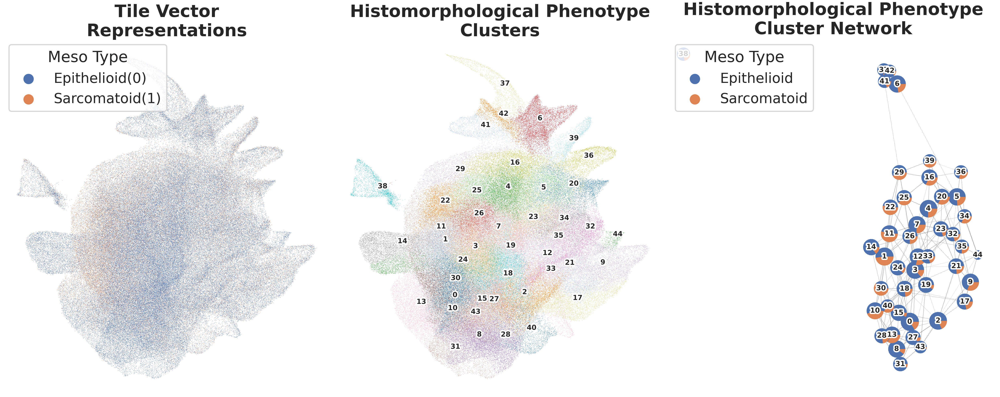

In [13]:
sns.set_theme(style='white')
show_umap_leiden(adata_train, meta_field, layout, random_state, threshold, node_size_scale, node_size_power, edge_width_scale, directory=figures_path,
                 file_name=file_name + '_clusternetwork_all_anno.jpg', fontsize=25, fontoutline=10, marker_size=5, ax_size=62, l_size=50, l_t_size=55, l_box_w=4,
                 l_markerscale=6, palette='tab20', figsize=(50,20))

In [116]:
# Representations and Cluster Network.
def subtype_umap(adata, marker_size=10, ax_size=16, l_size=12, l_t_size=14, l_box_w=1, l_markerscale=1, palette='tab20', figsize=(30,10)):
    from matplotlib.lines import Line2D

    # leiden_clusters = np.unique(adata.obs[groupby].astype(int))
    # colors = sns.color_palette(palette, len(leiden_clusters))

    fig = plt.figure(figsize=figsize)
    ax  = fig.add_subplot(1, 2, 1)
    # Epithelioid(0) and Sarcomatoid(1)
    ax = sc.pl.umap(adata, ax=ax, color='Meso_type', size=marker_size, show=False, frameon=False, na_color='black', palette=['#2ba7d0', '#d02ba9'])
    legend_c = ax.legend(loc='best', markerscale=l_markerscale, title='Meso Type by Logistic Regression', prop={'size': l_size})
    legend_c.get_title().set_fontsize(l_t_size)
    legend_c.get_frame().set_linewidth(l_box_w)
    legend_c.get_texts()[0].set_text('Epithelioid(0)')
    legend_c.get_texts()[1].set_text('Sarcomatoid / Biphasic(1)')
    ax.set_title('Logistic Regression Predictions', fontsize=ax_size, fontweight='bold')




    # Epithelioid and Sarcomatoid and Biphasic
    ax  = fig.add_subplot(1, 2, 2)
    # put dot shapes as triangle
    ax = sc.pl.umap(adata, ax=ax, color='type', size=marker_size, show=False, frameon=False, na_color='black' , palette=['#2bd035', '#2ba7d0', '#d02ba9'])
    legend_c = ax.legend(loc='best', markerscale=l_markerscale, title='Meso Types', prop={'size': l_size})
    legend_c.get_title().set_fontsize(l_t_size)
    legend_c.get_frame().set_linewidth(l_box_w)
    ax.set_title('Subtypes', fontsize=ax_size, fontweight='bold')
    # adjust_text(ax.texts)


    plt.tight_layout()
    # plt.savefig(os.path.join(directory,file_name))
    plt.show()

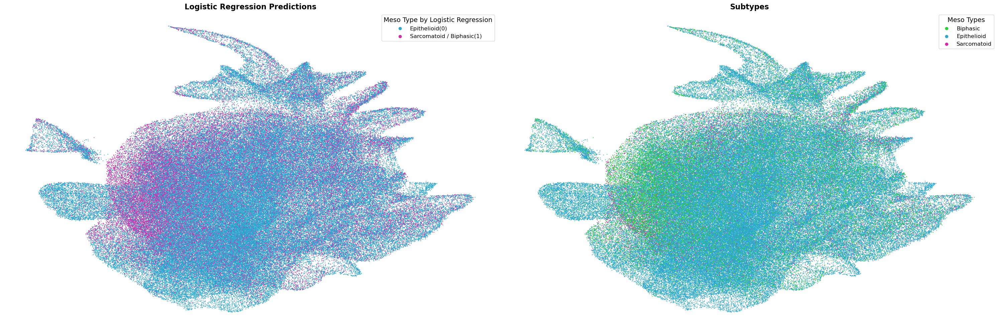

In [146]:
subtype_umap(adata_train)

In [157]:
# Representations and Cluster Network.
def two_fig_umap(adata, meta_fields, titles, marker_size=1000, ax_size=16, l_size=12, l_t_size=14, l_box_w=1, l_markerscale=1, palette='tab20', figsize=(30,10)):
    from matplotlib.lines import Line2D

    fig = plt.figure(figsize=figsize)
    ax  = fig.add_subplot(1, 2, 1)
    ax = sc.pl.umap(adata, ax=ax, color=meta_fields[0], legend_loc='on data', size=marker_size, show=False, frameon=False, na_color='black', palette=palette)
    legend_c = ax.legend(loc='best', markerscale=l_markerscale, prop={'size': l_size})
    legend_c.get_title().set_fontsize(l_t_size)
    legend_c.get_frame().set_linewidth(l_box_w)
    ax.set_title(titles[0] , fontsize=ax_size, fontweight='bold')





    ax  = fig.add_subplot(1, 2, 2)
    ax = sc.pl.umap(adata, ax=ax, color=meta_fields[1], size=marker_size, show=False, frameon=False, na_color='black', palette= palette)
    legend_c = ax.legend(loc='best', markerscale=l_markerscale, title=titles[1], prop={'size': l_size})
    legend_c.get_title().set_fontsize(l_t_size)
    legend_c.get_frame().set_linewidth(l_box_w)
    ax.set_title(titles[1] , fontsize=ax_size, fontweight='bold')


    plt.tight_layout()
    # plt.savefig(os.path.join(directory,file_name))
    plt.show()

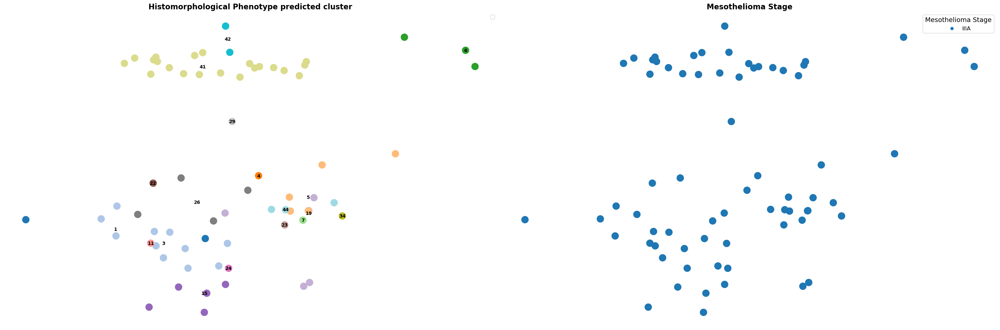

In [158]:
two_fig_umap(wsi, ['leiden_2.0', 'stage'], ['Histomorphological Phenotype predicted cluster', 'Mesothelioma Stage'])